# Example of adversarial attack on ResNet50 network

In [11]:
# import necessary packages
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.applications.resnet50 import decode_predictions
from tensorflow.keras.applications.resnet50 import preprocess_input
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os

### Load ResNet50 network with weights and set parameters

In [12]:
model = ResNet50(weights="imagenet")
print('ResNet50 model loaded with',len(model.layers),'layers')
optimizer = Adam(learning_rate=0.01)
lossFunct = SparseCategoricalCrossentropy()

ResNet50 model loaded with 177 layers


### Load the initial image

In [13]:
image_name = 'kot-frusia'
#image_name = 'lama'

image = cv2.imread(f"{image_name}.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, (224, 224))
image = np.expand_dims(image, axis=0)
# change to tensor
baseImage = tf.constant(image, dtype=tf.float32)
print("Image",image_name,"loaded")

Image kot-frusia loaded


### Original prediction

Predicted class:  285 Egyptian_cat 0.9543443


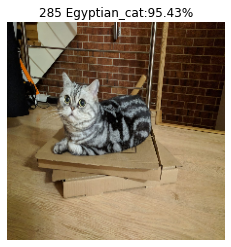

In [14]:
org_pred = model.predict(tf.keras.applications.resnet50.preprocess_input(image))
dec_pred = decode_predictions(org_pred, top=3)[0]
real_class = org_pred.argmax()
real_label = dec_pred[0][1]
real_pred = dec_pred[0][2]
print("Predicted class: ",real_class,real_label,real_pred)
plt.imshow(image[0])
plt.title(f"{real_class} {real_label}:{real_pred*100:.2f}%")
plt.axis("off")  
plt.show()

### One learning step

In [19]:
def do_step(image,delta,real_class):
    with tf.GradientTape() as tape:
        tape.watch(delta)
        adversary = tf.keras.applications.resnet50.preprocess_input(baseImage + delta)
        predictions = model(adversary, training=False)

        originalLoss = lossFunct(tf.convert_to_tensor([real_class]),predictions)
        loss = - originalLoss
# Uncomment for targeted attack
#         originalLoss = lossFunct(tf.convert_to_tensor([real_class]),predictions)
#         targetLoss = lossFunct(tf.convert_to_tensor([target_class]),predictions)
#         loss = targetLoss - originalLoss  # goal: minimize error to targetLoss and maximize error to originalLoss

        
    gradients = tape.gradient(loss, delta)
    #optimizer.apply_gradients([(gradients, delta)])
    #delta.assign_add(delta)
    
    optimizer.apply_gradients([(gradients, delta)])
    clipped_delta = tf.clip_by_value(delta, clip_value_min=-0.01, clip_value_max=0.01)
    delta.assign_add(clipped_delta)

    
    return delta,loss

### Visualisation

In [20]:
def show_step(delta,loss):  
    print("step: {}, loss: {}...".format(step, loss.numpy()))
    adverImage = (baseImage + delta).numpy().squeeze()
    adverImage = np.clip(adverImage, 0, 255).astype("uint8")
    adverImage = np.expand_dims(adverImage, axis=0)
    predictions = model.predict(tf.keras.applications.resnet50.preprocess_input(adverImage))
    top3 = decode_predictions(predictions, top=3)[0]
    print("{}. {} -> ({}:{:.2f}, {}:{:.2f}, {}:{:.2f})".format(step,real_label,
                top3[0][1],top3[0][2],
                top3[1][1],top3[1][2],
                top3[2][1],top3[2][2]))

    fig=plt.figure(figsize=(12,8))
    ax = plt.subplot(1, 3, 1)
    plt.title(f"Original {real_label}:{100*real_pred:.2f}%")
    plt.imshow(image.squeeze())
    plt.axis("off")  
    ax = plt.subplot(1, 3, 2)
    plt.title("Delta")
    plt.imshow(np.clip((delta.numpy().squeeze()*256).astype("uint8"), 0, 255))
    plt.axis("off")  
    ax = plt.subplot(1, 3, 3)
    plt.title(f"Adversary {top3[0][1]}:{100*top3[0][2]:.2f}%")
    plt.imshow(adverImage.squeeze())
    plt.axis("off")  
    plt.show() 
    cv2.imwrite(f"outdir/{image_name}_{step:02d}.jpg", cv2.cvtColor(adverImage.squeeze(), cv2.COLOR_RGB2BGR))


### The learning loop

step: 0, loss: 13.846891403198242...
0. Egyptian_cat -> (Egyptian_cat:0.57, Norwegian_elkhound:0.07, tiger_cat:0.04)


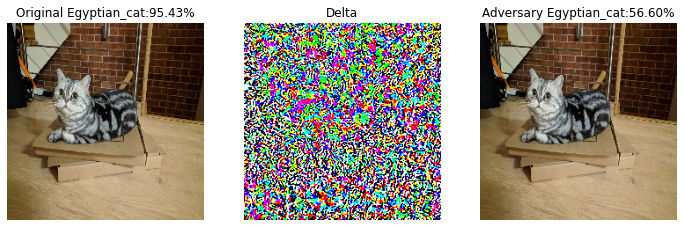

step: 2, loss: 12.912435531616211...
2. Egyptian_cat -> (Egyptian_cat:0.56, Norwegian_elkhound:0.07, tiger_cat:0.04)


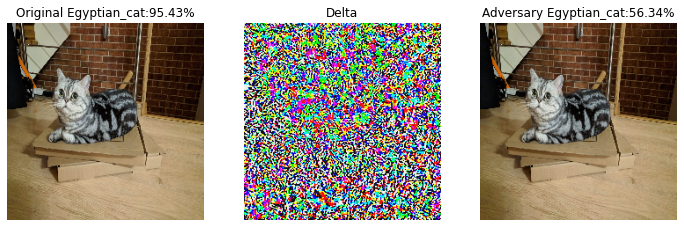

step: 4, loss: 11.85861587524414...
4. Egyptian_cat -> (Egyptian_cat:0.56, Norwegian_elkhound:0.07, tiger_cat:0.04)


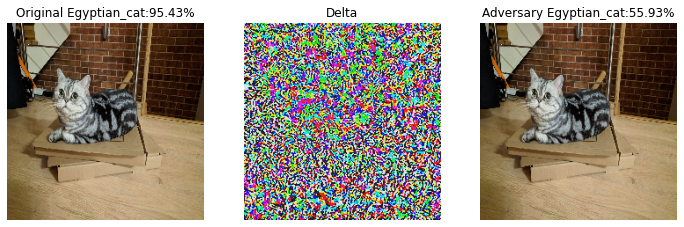

step: 6, loss: 10.778055191040039...
6. Egyptian_cat -> (Egyptian_cat:0.56, Norwegian_elkhound:0.08, tiger_cat:0.04)


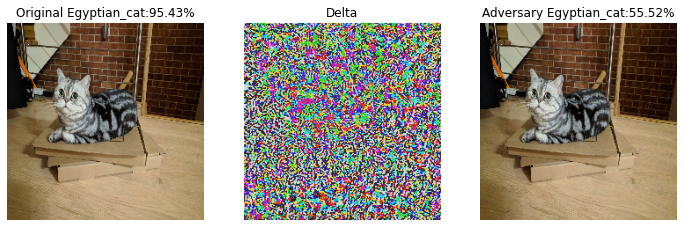

step: 8, loss: 9.74659252166748...
8. Egyptian_cat -> (Egyptian_cat:0.55, Norwegian_elkhound:0.08, tiger_cat:0.04)


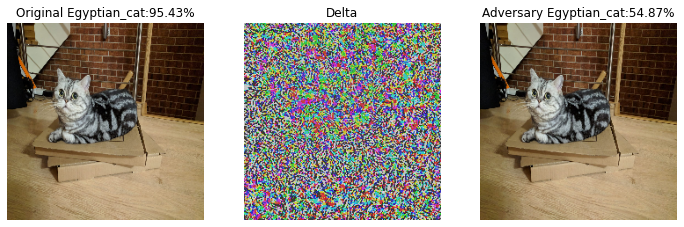

step: 10, loss: 8.762347221374512...
10. Egyptian_cat -> (Egyptian_cat:0.54, Norwegian_elkhound:0.08, tiger_cat:0.04)


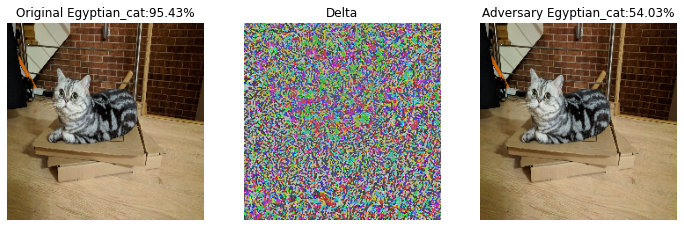

step: 12, loss: 7.829606533050537...
12. Egyptian_cat -> (Egyptian_cat:0.53, Norwegian_elkhound:0.08, malamute:0.04)


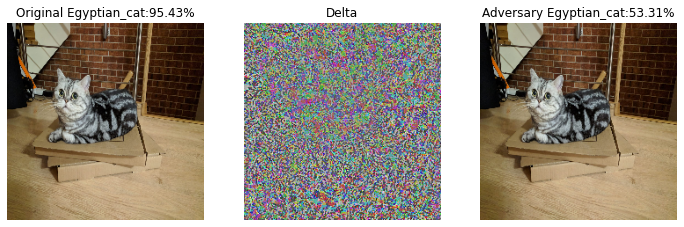

step: 14, loss: 6.9078874588012695...
14. Egyptian_cat -> (Egyptian_cat:0.52, Norwegian_elkhound:0.08, malamute:0.05)


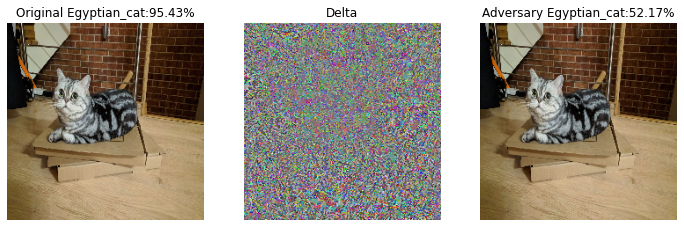

step: 16, loss: 6.012451171875...
16. Egyptian_cat -> (Egyptian_cat:0.51, Norwegian_elkhound:0.09, malamute:0.05)


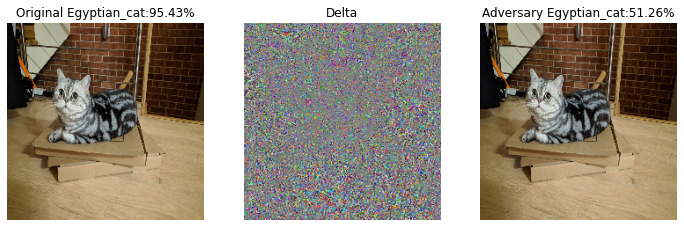

step: 18, loss: 5.144427299499512...
18. Egyptian_cat -> (Egyptian_cat:0.50, Norwegian_elkhound:0.09, malamute:0.05)


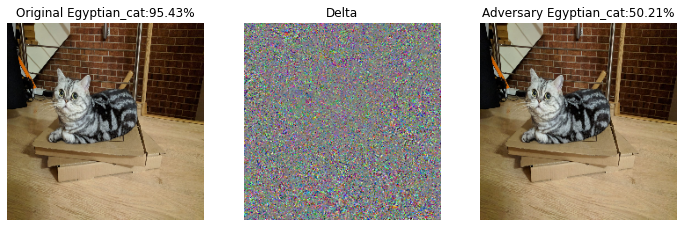

step: 20, loss: 4.283707618713379...
20. Egyptian_cat -> (Egyptian_cat:0.49, Norwegian_elkhound:0.09, malamute:0.05)


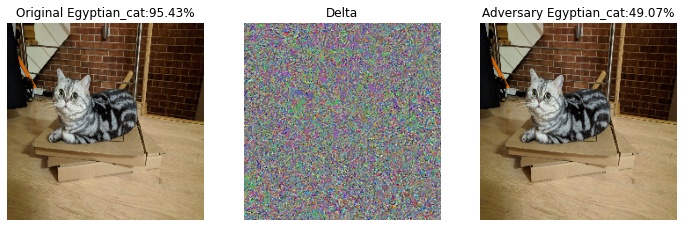

step: 22, loss: 3.453040838241577...
22. Egyptian_cat -> (Egyptian_cat:0.48, Norwegian_elkhound:0.09, malamute:0.05)


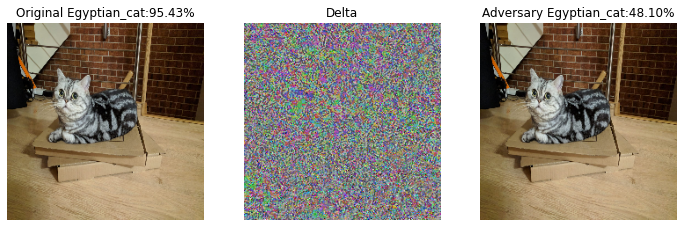

step: 24, loss: 2.6444692611694336...
24. Egyptian_cat -> (Egyptian_cat:0.47, Norwegian_elkhound:0.10, malamute:0.05)


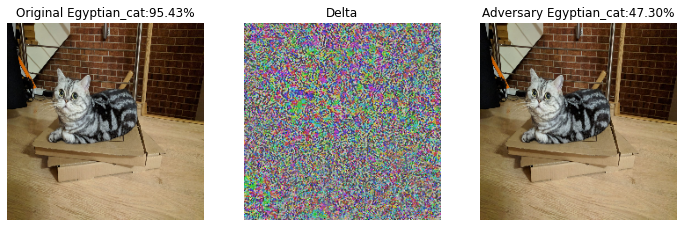

step: 26, loss: 1.8606654405593872...
26. Egyptian_cat -> (Egyptian_cat:0.46, Norwegian_elkhound:0.10, malamute:0.05)


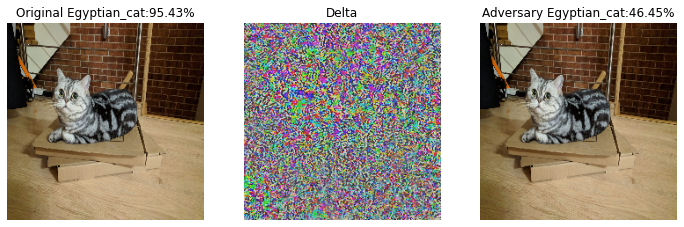

step: 28, loss: 1.0734753608703613...
28. Egyptian_cat -> (Egyptian_cat:0.46, Norwegian_elkhound:0.10, malamute:0.06)


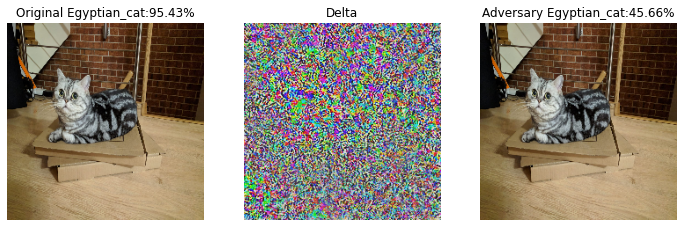

step: 30, loss: 0.29628658294677734...
30. Egyptian_cat -> (Egyptian_cat:0.45, Norwegian_elkhound:0.10, malamute:0.06)


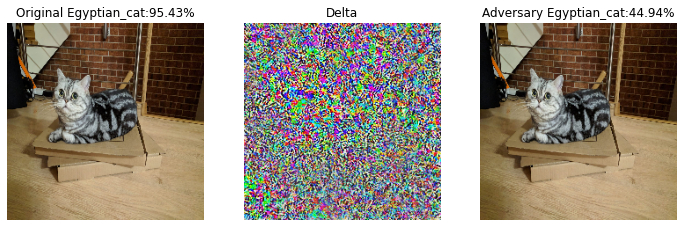

step: 32, loss: -0.48726797103881836...
32. Egyptian_cat -> (Egyptian_cat:0.21, Norwegian_elkhound:0.16, malamute:0.09)


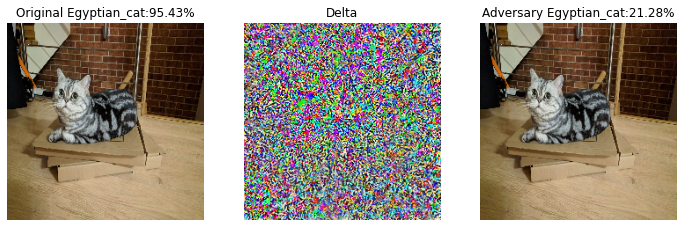

step: 34, loss: -1.262303352355957...
34. Egyptian_cat -> (llama:0.24, Norwegian_elkhound:0.11, malamute:0.08)


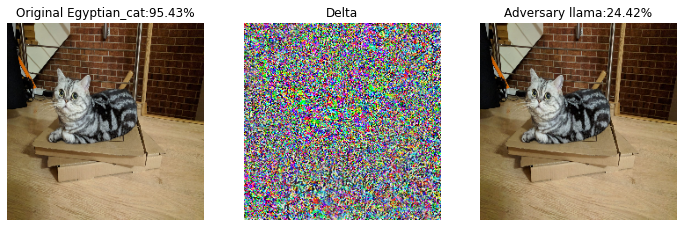

step: 36, loss: -2.0047507286071777...
36. Egyptian_cat -> (llama:0.47, Norwegian_elkhound:0.07, malamute:0.05)


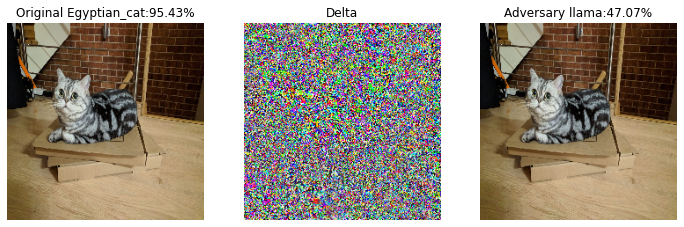

step: 38, loss: -2.7287955284118652...
38. Egyptian_cat -> (llama:0.59, Norwegian_elkhound:0.05, malamute:0.04)


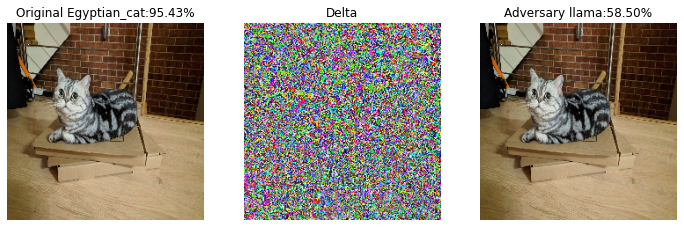

step: 40, loss: -3.440366744995117...
40. Egyptian_cat -> (llama:0.65, Norwegian_elkhound:0.04, malamute:0.03)


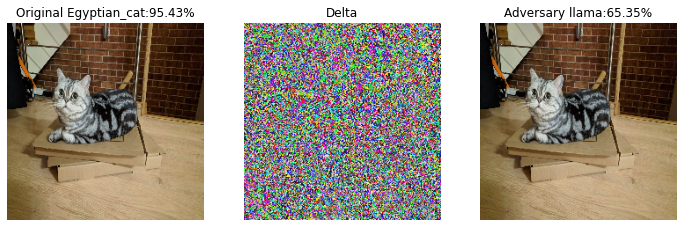

step: 42, loss: -4.159511566162109...
42. Egyptian_cat -> (llama:0.70, Norwegian_elkhound:0.03, malamute:0.03)


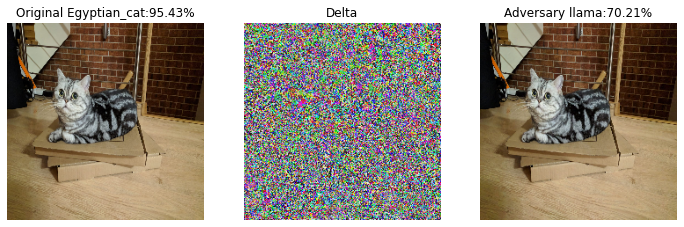

step: 44, loss: -4.884432792663574...
44. Egyptian_cat -> (llama:0.74, Norwegian_elkhound:0.03, malamute:0.02)


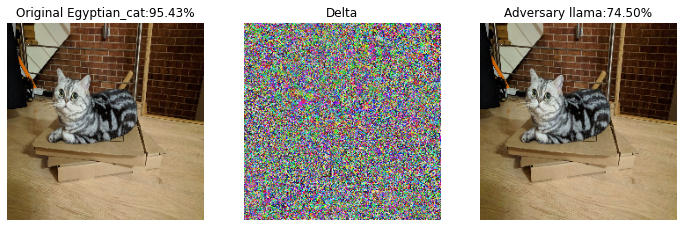

step: 46, loss: -5.62440299987793...
46. Egyptian_cat -> (llama:0.78, Norwegian_elkhound:0.02, malamute:0.02)


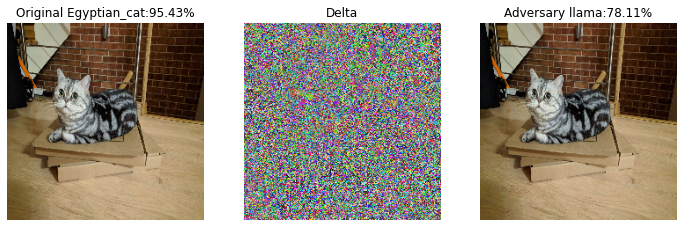

step: 48, loss: -6.340579032897949...
48. Egyptian_cat -> (llama:0.81, Norwegian_elkhound:0.02, malamute:0.02)


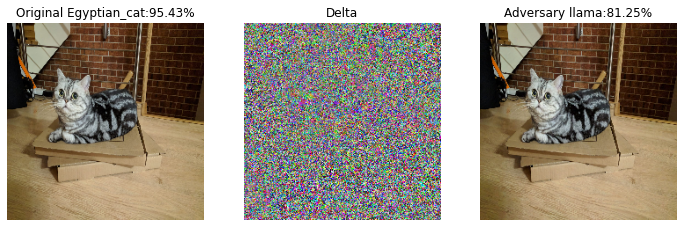

step: 50, loss: -7.051774978637695...
50. Egyptian_cat -> (llama:0.84, malamute:0.01, Norwegian_elkhound:0.01)


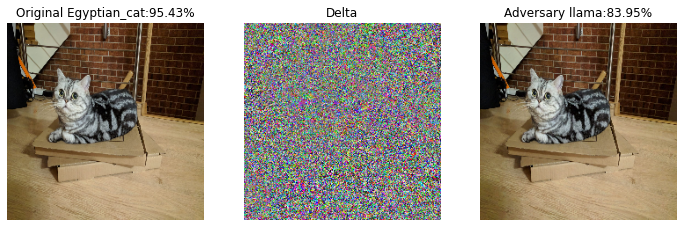

step: 52, loss: -7.742733955383301...
52. Egyptian_cat -> (llama:0.86, malamute:0.01, Norwegian_elkhound:0.01)


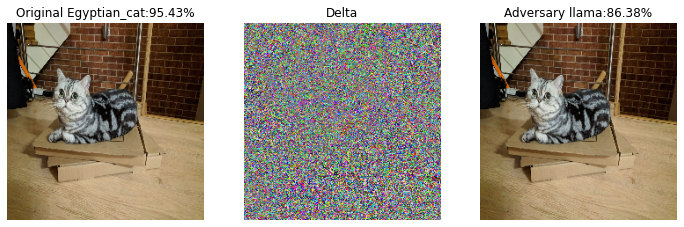

step: 54, loss: -8.416092872619629...
54. Egyptian_cat -> (llama:0.88, malamute:0.01, plunger:0.01)


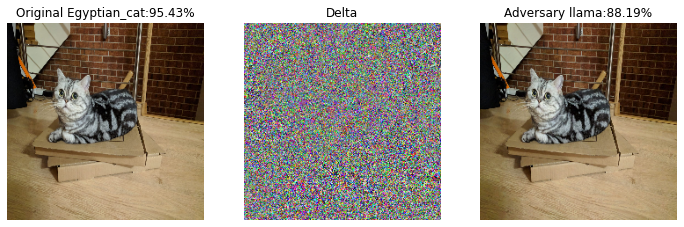

step: 56, loss: -9.089692115783691...
56. Egyptian_cat -> (llama:0.90, malamute:0.01, plunger:0.01)


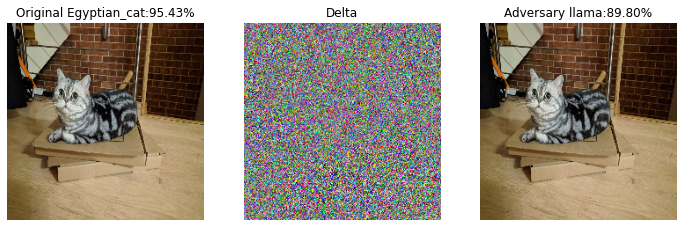

step: 58, loss: -9.74629020690918...
58. Egyptian_cat -> (llama:0.91, plunger:0.01, malamute:0.01)


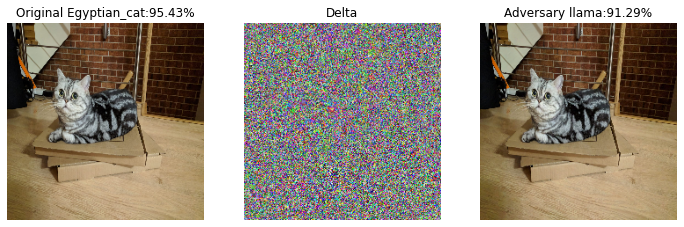

step: 60, loss: -10.38709831237793...
60. Egyptian_cat -> (llama:0.93, plunger:0.01, hen:0.01)


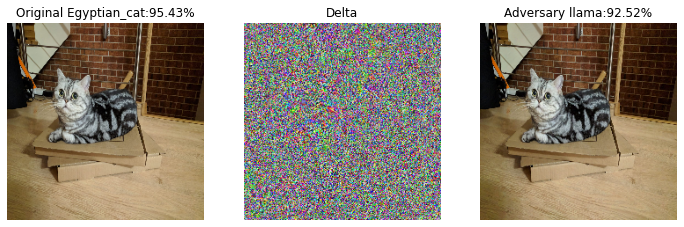

step: 62, loss: -11.01504898071289...
62. Egyptian_cat -> (llama:0.94, plunger:0.00, hen:0.00)


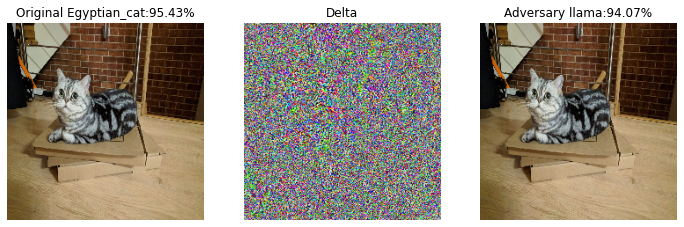

step: 64, loss: -11.642692565917969...
64. Egyptian_cat -> (llama:0.96, ostrich:0.00, plunger:0.00)


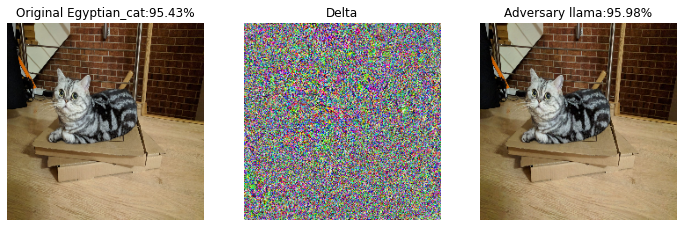

step: 66, loss: -12.28019905090332...
66. Egyptian_cat -> (llama:0.98, ostrich:0.00, hen:0.00)


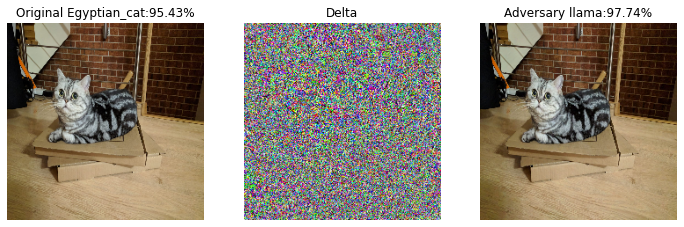

step: 68, loss: -12.897141456604004...
68. Egyptian_cat -> (llama:0.99, ostrich:0.00, hen:0.00)


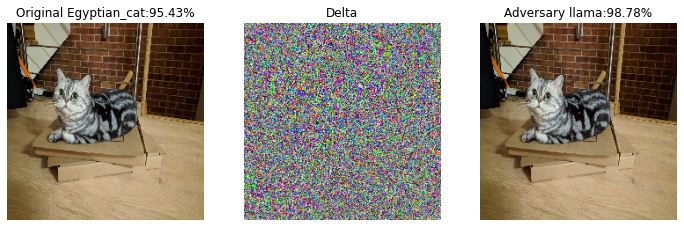

step: 70, loss: -13.499536514282227...
70. Egyptian_cat -> (llama:0.99, ostrich:0.00, hen:0.00)


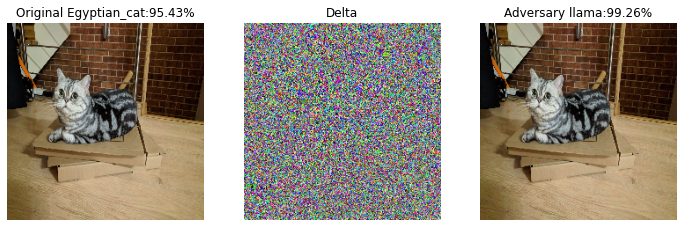

step: 72, loss: -14.08452320098877...
72. Egyptian_cat -> (llama:1.00, ostrich:0.00, hen:0.00)


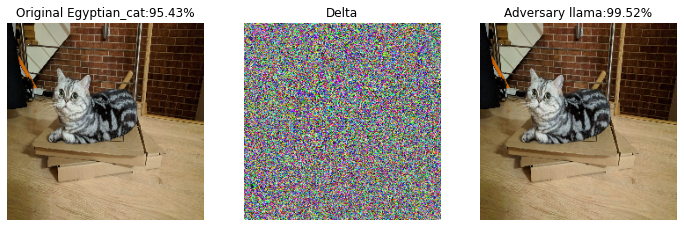

step: 74, loss: -14.657451629638672...
74. Egyptian_cat -> (llama:1.00, ostrich:0.00, hen:0.00)


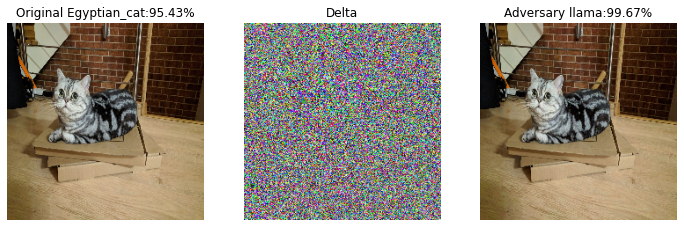

step: 76, loss: -15.232757568359375...
76. Egyptian_cat -> (llama:1.00, ostrich:0.00, hen:0.00)


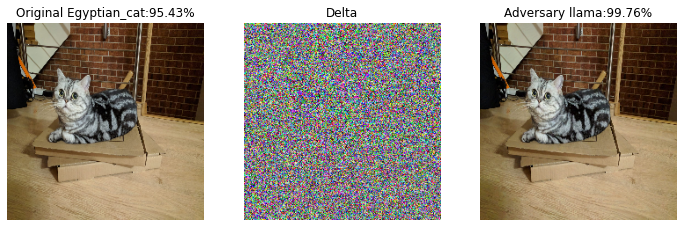

step: 78, loss: -15.80743408203125...
78. Egyptian_cat -> (llama:1.00, ostrich:0.00, hen:0.00)


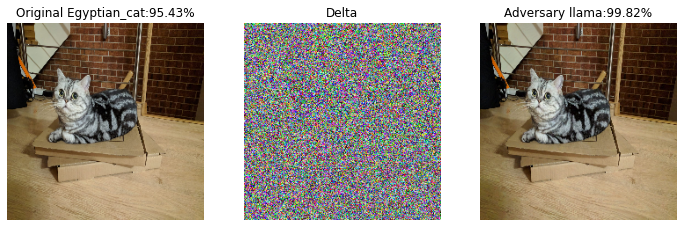

step: 80, loss: -16.116357803344727...
80. Egyptian_cat -> (llama:1.00, ostrich:0.00, hen:0.00)


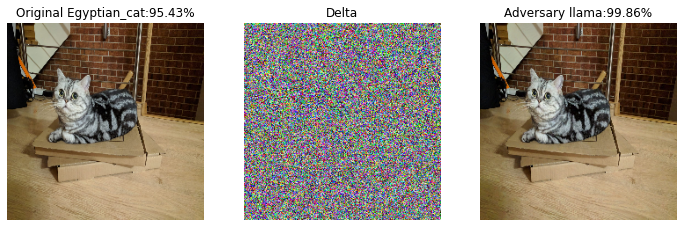

step: 82, loss: -16.116708755493164...
82. Egyptian_cat -> (llama:1.00, ostrich:0.00, hen:0.00)


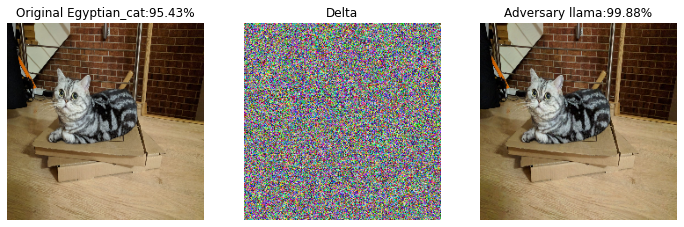

step: 84, loss: -16.1169376373291...
84. Egyptian_cat -> (llama:1.00, ostrich:0.00, hen:0.00)


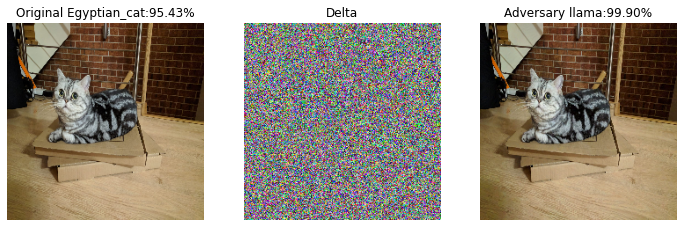

step: 86, loss: -16.117088317871094...
86. Egyptian_cat -> (llama:1.00, ostrich:0.00, hen:0.00)


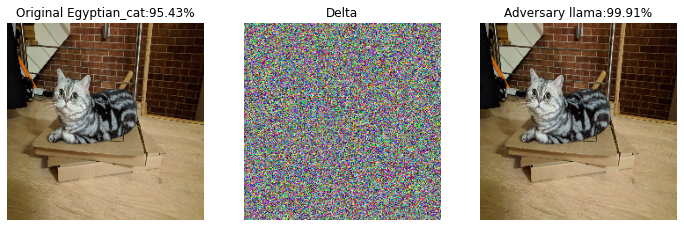

step: 88, loss: -16.117191314697266...
88. Egyptian_cat -> (llama:1.00, ostrich:0.00, hen:0.00)


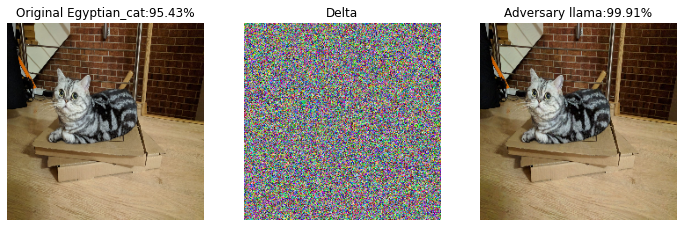

step: 90, loss: -16.117265701293945...
90. Egyptian_cat -> (llama:1.00, ostrich:0.00, hen:0.00)


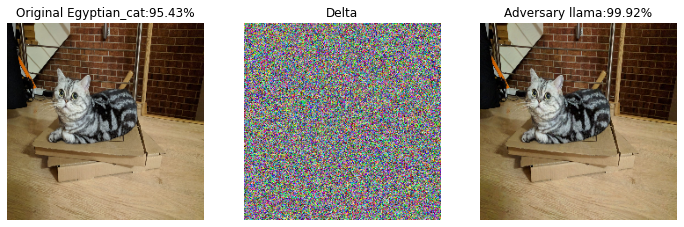

step: 92, loss: -16.117321014404297...
92. Egyptian_cat -> (llama:1.00, ostrich:0.00, hen:0.00)


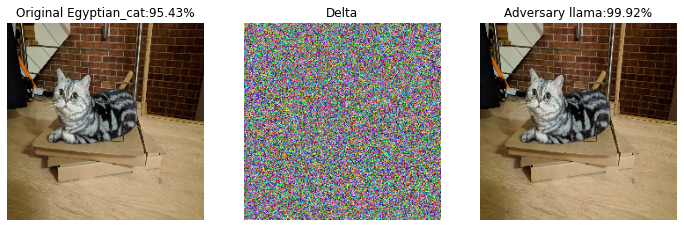

step: 94, loss: -16.11736297607422...
94. Egyptian_cat -> (llama:1.00, ostrich:0.00, hen:0.00)


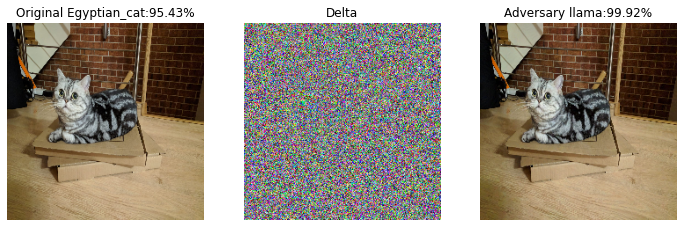

step: 96, loss: -16.117395401000977...
96. Egyptian_cat -> (llama:1.00, ostrich:0.00, hen:0.00)


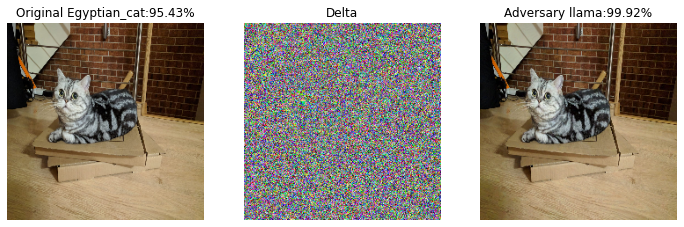

step: 98, loss: -16.117420196533203...
98. Egyptian_cat -> (llama:1.00, ostrich:0.00, hen:0.00)


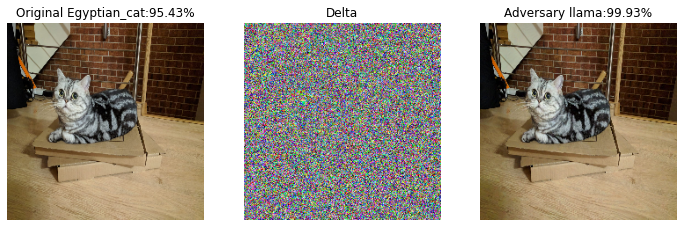

Done


In [21]:
steps = 100

target_class = 355 # code of "llama" class - see resntt50_classes.txt for all codes
delta = tf.Variable(tf.zeros_like(baseImage), trainable=True)
for step in range(0, steps):
    delta,loss = do_step(baseImage, delta, real_class)
    if step % 2==0:
        show_step(delta,loss)
print("Done")